In [1]:
import plotly.express as px

In [2]:
import pandas as pd
import requests

print(" All packages imported successfully!")
print(" Ready to build our world population visualization!")


 All packages imported successfully!
 Ready to build our world population visualization!


In [4]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import requests
from datetime import datetime

print (" All Packages imported successfully!")


 All Packages imported successfully!


In [13]:
class DataLoader:
    """
    Handles fetching and processing world population data.
    
    This class demonstrates:
    - Object-Oriented Programming (encapsulation)
    - API integration
    - Data cleaning with pandas
    """
    
    def __init__(self):
        """Initialize the DataLoader with World Bank API endpoint"""
        self.base_url = "https://api.worldbank.org/v2/country/all/indicator/SP.POP.TOTL"
        self.data = None
        self.cleaned_data = None
        
    def fetch_population_data(self, start_year=1960, end_year=2023):
        """
        Fetch population data from World Bank API
        
        Parameters:
        - start_year: Starting year for data (default 1960)
        - end_year: Ending year for data (default 2023)
        
        Returns:
        - DataFrame with population data
        """
        print(f"📥 Fetching population data from {start_year} to {end_year}...")
        
        # World Bank API parameters
        params = {
            'date': f'{start_year}:{end_year}',
            'format': 'json',
            'per_page': 20000  # Get all records
        }
        
        try:
            response = requests.get(self.base_url, params=params, timeout=30)
            response.raise_for_status()
            
            # World Bank returns [metadata, data]
            json_data = response.json()
            
            if len(json_data) < 2:
                print("❌ No data returned from API")
                return None
                
            data_records = json_data[1]
            
            # Convert to DataFrame
            self.data = pd.DataFrame(data_records)
            print(f"✅ Fetched {len(self.data)} records!")
            
            return self.data
            
        except requests.exceptions.RequestException as e:
            print(f"❌ Error fetching data: {e}")
            return None
    
    def clean_data(self):
        """
        Clean and prepare data for visualization
        
        This method:
        - Removes aggregates (World, regions, etc.)
        - Extracts relevant columns
        - Handles missing values
        - Converts data types
        """
        if self.data is None:
            print("❌ No data to clean. Run fetch_population_data() first!")
            return None
        
        print("🧹 Cleaning data...")
        
        # Extract relevant columns
        df = self.data.copy()
        
        # Create cleaned dataframe
        cleaned = pd.DataFrame({
            'country': df['country'].apply(lambda x: x['value'] if isinstance(x, dict) else x),
            'country_code': df['countryiso3code'],
            'year': df['date'].astype(int),
            'population': df['value']
        })
        
        # Remove rows with missing population data
        cleaned = cleaned.dropna(subset=['population'])
        
        # Remove aggregate regions (they don't have 3-letter ISO codes or have specific codes)
        # Keep only countries with valid 3-letter ISO codes
        aggregate_codes = ['ARB', 'CSS', 'CEB', 'EAR', 'EAS', 'EAP', 'TEA', 'EMU', 'ECS', 
                          'ECA', 'TEC', 'EUU', 'FCS', 'HPC', 'HIC', 'IBD', 'IBT', 'IDB',
                          'IDX', 'IDA', 'LTE', 'LCN', 'LAC', 'TLA', 'LDC', 'LMY', 'LIC',
                          'LMC', 'MEA', 'MNA', 'TMN', 'MIC', 'NAC', 'OED', 'OSS', 'PSS',
                          'PST', 'PRE', 'SST', 'SAS', 'TSA', 'SSF', 'SSA', 'TSS', 'UMC',
                          'WLD']
        
        cleaned = cleaned[~cleaned['country_code'].isin(aggregate_codes)]
        cleaned = cleaned[cleaned['country_code'].notna()]
        cleaned = cleaned[cleaned['country_code'].str.len() == 3]
        
        # Convert population to numeric
        cleaned['population'] = pd.to_numeric(cleaned['population'], errors='coerce')
        
        # Sort by year and country
        cleaned = cleaned.sort_values(['year', 'country']).reset_index(drop=True)
        
        self.cleaned_data = cleaned
        
        print(f"✅ Cleaned data: {len(cleaned)} records")
        print(f"   Countries: {cleaned['country'].nunique()}")
        print(f"   Years: {cleaned['year'].min()} to {cleaned['year'].max()}")
        
        return self.cleaned_data
    
    def get_data_summary(self):
        """Get a summary of the loaded data"""
        if self.cleaned_data is None:
            print("❌ No cleaned data available!")
            return None
        
        summary = {
            'total_records': len(self.cleaned_data),
            'countries': self.cleaned_data['country'].nunique(),
            'year_range': f"{self.cleaned_data['year'].min()} - {self.cleaned_data['year'].max()}",
            'total_population_latest': self.cleaned_data[
                self.cleaned_data['year'] == self.cleaned_data['year'].max()
            ]['population'].sum()
        }
        
        return summary
        

In [19]:
# Create instance of Dataloader
loader = DataLoader()

# fetch data (this might take  10-20 seconds)
loader.fetch_population_data(start_year=1960, end_year=2023)

#Clean the data
df = loader.clean_data()

# Get summary
summary = loader.get_data_summary()
print("\n📊 Data Summary:")
for key, value in summary.items():
    print(f"  {key}: {value}")

# preview the data

print("\n👀 First few rows:")
df.head(10)

📥 Fetching population data from 1960 to 2023...
✅ Fetched 17024 records!
🧹 Cleaning data...
✅ Cleaned data: 13986 records
   Countries: 219
   Years: 1960 to 2023

📊 Data Summary:
  total_records: 13986
  countries: 219
  year_range: 1960 - 2023
  total_population_latest: 9301505671.0

👀 First few rows:


,country,country_code,year,population
0,Afghanistan,AFG,1960,9035043.0
1,Africa Eastern and Southern,AFE,1960,130075728.0
2,Africa Western and Central,AFW,1960,97630925.0
3,Albania,ALB,1960,1608800.0
4,Algeria,DZA,1960,11424922.0
5,American Samoa,ASM,1960,20133.0
6,Andorra,AND,1960,9510.0
7,Angola,AGO,1960,5231654.0
8,Antigua and Barbuda,ATG,1960,55603.0
9,Argentina,ARG,1960,20386045.0


In [35]:
class MapVisualizer:
    """
    Creates interactive map visualizations of population data.

    This class demonstrates:
    - Inheritance concepts (we could extend this class later)
    - Plotly choropleth maps
    - Animation with time slider
    """

    def __init__(self, data):
        """
        Inititalize visualizer with cleaned data

        Parameters:
        - data: Cleaned DataFrame with population data
        """
        self.data = data
        self.fig = None

    def prepare_data_for_viz(self):
        """
        Prepare data with additional calculated fields for visualization
        """
        df = self.data.copy()

        #Calculate population in millions for better readability
        df['population_millions'] = df['population'] / 1_000_000

        #Calculate year-over-year growth rate
        df = df.sort_values(['country_code', 'year'])
        df['population_change'] = df.groupby('country_code')['population'].pct_change() * 100

        # Fill NaN values in population_change with 0
        df['population_change'] = df['population_change'].fillna(0)

        print(f" ✅ Data prepared for visualization")
        return df

    def create_choropleth_map(self, color_mode='population'):
        """ 
        Create an animated choropleth map

        Parameter:
        -color_mode: What to visualize
        - 'population' : Color by population size
        - 'growth' : Color by population growth rate
        - 'density' : Color by population (will add density calculation)

        Returns:
        - Plotly figure object
        """
        df = self.prepare_data_for_viz()

        print(f"🎨 Creating choropleth map (color mode: {color_mode})...")

        #Determine what to color by
        if color_mode == 'population':
            color_column = 'population_millions'
            color_label = 'Population (Millions)'
            color_scale = 'Viridis'
            hover_template = (
                '<b>%customdata[0]}</b><br>'
                'Year: %{customdata[1]}<br>'
                'Population: %{customdata[2]:,.0f}<br>'
                'Growth Rate: %{customdata[3]:.2f}%<br>'
                '<extra></extra>'
            )

        elif color_mode == 'growth':
            color_column = 'population_change'
            color_label = 'Population Growth Rate (%)'
            color_scale = 'RdYlGn'
            hover_template = (
                '<b>%{customdata[0]}</b><br>'
                'Year: %{customdata[1]}<br>'
                'Population: %{customdata[2]:,.0f}<br>'
                'Growth Rate: %{customdata[3]:.2f}%<br>'
                '<extra></extra>'
            )

        else:
            color_column = 'population_millions'
            color_label = 'Population (Millions)'
            color_scale = 'Viridis'
            hover_template = (
                '<b>%{customdata[0]}</b><br>'
                'Year: %{customdata[1]}<br>'
                'Population: %{customdata[2]:,.0f}<br>'
                '<extra></extra>'    
            
            )

        # Create custom data for hover template
        df['hover_population'] = df['population']
        df['hover_country'] = df['country']
        df['hover_year'] = df['year']
        df['hover_growth'] = df['population_change']
        
        # Create the choropleth map
        self.fig = px.choropleth(
            df,
            locations='country_code',
            color=color_column,
            hover_name='country',
            animation_frame='year',
            color_continuous_scale=color_scale,
            labels={color_column: color_label},
            title=f'World Population Visualization ({df["year"].min()}-{df["year"].max()})',
            custom_data=['hover_country', 'hover_year', 'hover_population', 'hover_growth']
        )


        # Update layout for better appearance
        self.fig.update_layout(
            geo=dict(
                showframe=False,
                showcoastlines=True,
                projection_type='natural earth'
            ),
            height=700,
            title_font_size=24,
            title_x=0.5,
            coloraxis_colorbar=dict(
                title=color_label,
                thickness=20,
                len=0.7
            )
        )

        # Update hover template
        self.fig.update_traces(
            hovertemplate=hover_template
        )
        
        # Configure animation settings
        self.fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 300
        self.fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 200
        
        print(f"✅ Map created successfully!")
        return self.fig
    
    def create_bubble_map(self):
        """
        Create an animated bubble map where bubble size = population
        """
        df = self.prepare_data_for_viz()
        
        print(f"🎨 Creating bubble map...")
        
        # We need lat/lon for bubbles - let's use country centroids
        # For now, we'll create a simple version
        # In a production version, you'd load actual coordinates
        
        self.fig = px.scatter_geo(
            df,
            locations='country_code',
            color='population_millions',
            hover_name='country',
            size='population_millions',
            animation_frame='year',
            projection='natural earth',
            title=f'World Population (Bubble Size) - {df["year"].min()}-{df["year"].max()}',
            color_continuous_scale='Plasma',
            size_max=50
        )
        
        self.fig.update_layout(
            height=700,
            title_font_size=24,
            title_x=0.5
        )
        
        print(f"✅ Bubble map created successfully!")
        return self.fig


    def show(self):
        """Display the visualization"""
        if self.fig is None:
            print("❌ No visualization created yet. Run create_choropleth_map() or create_bubble_map() first!")
            return
        
        self.fig.show()
    
    def save_html(self, filename='world_population_viz.html'):
        """
        Save the visualization as an HTML file
        
        Parameters:
        - filename: Output filename (default: world_population_viz.html)
        """
        if self.fig is None:
            print("❌ No visualization created yet!")
            return
        
        self.fig.write_html(filename)
        print(f"✅ Visualization saved as '{filename}'")

 ✅ Data prepared for visualization
🎨 Creating choropleth map (color mode: population)...
✅ Map created successfully!


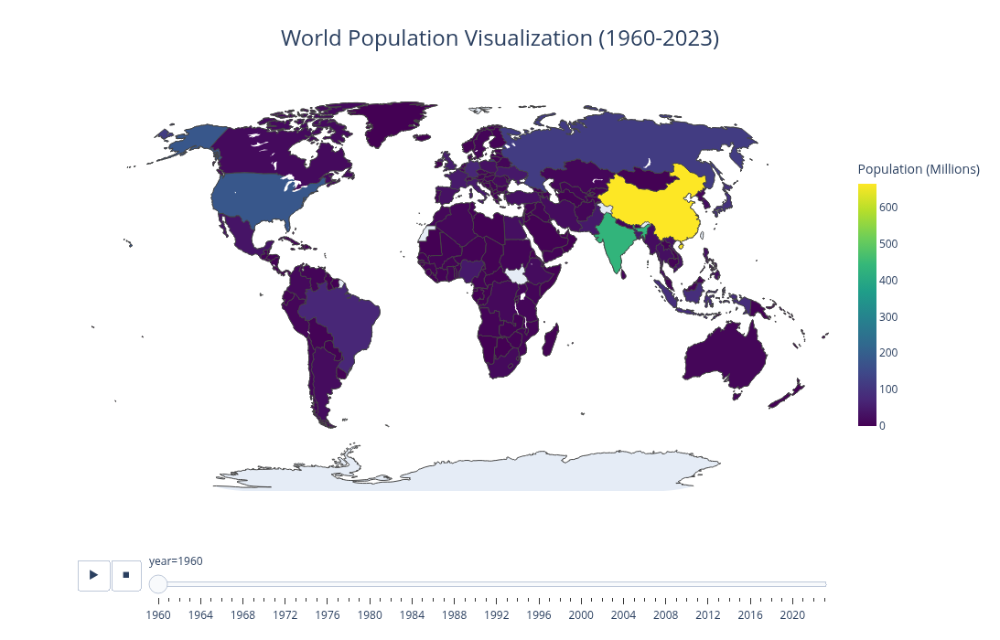

In [37]:
# Create visualizer(df) 
viz = MapVisualizer(df)

# Option 1: Choropleth map colored by population
fig1 = viz.create_choropleth_map(color_mode='population')
viz.show()

 ✅ Data prepared for visualization
🎨 Creating choropleth map (color mode: growth)...
✅ Map created successfully!


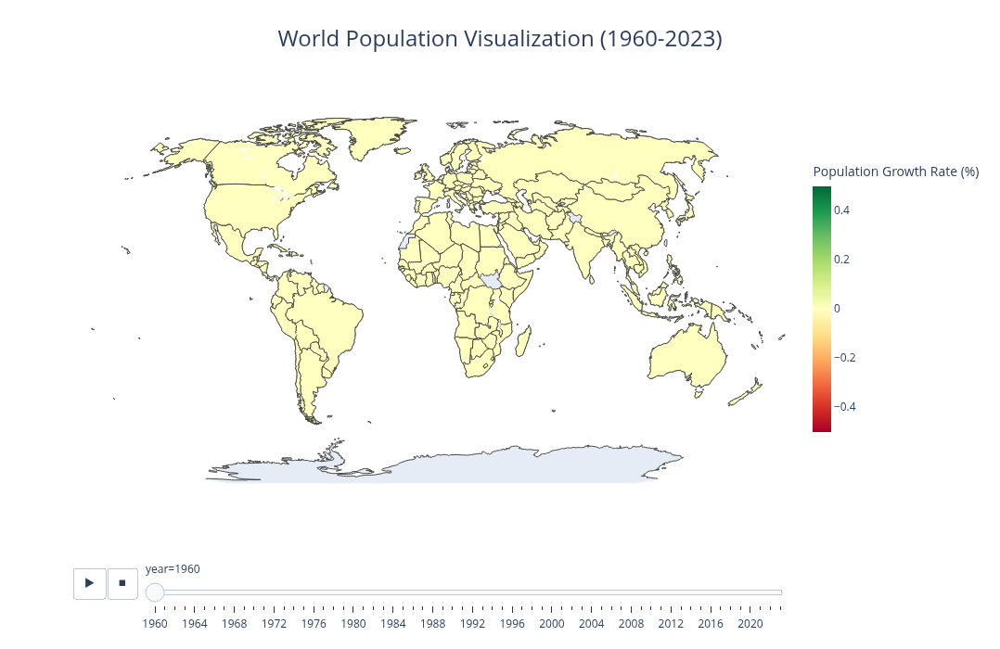

In [39]:
viz2 = MapVisualizer(df)
fig2 = viz2.create_choropleth_map(color_mode='growth')
viz2.show()


 ✅ Data prepared for visualization
🎨 Creating choropleth map (color mode: growth)...
✅ Map created successfully!


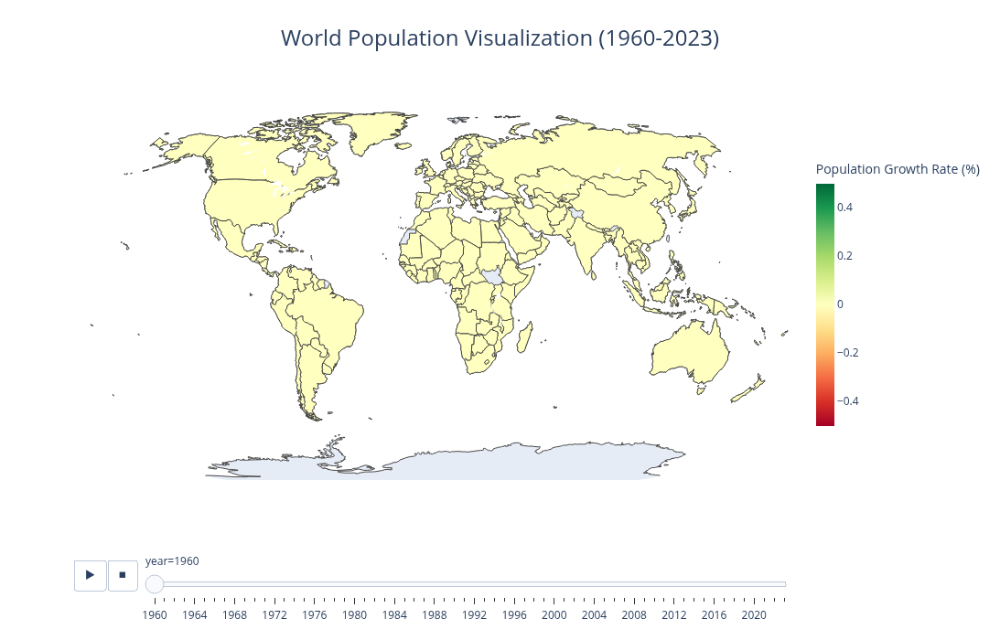

In [40]:
# Option 2: Choropleth map colored by GROWTH RATE
viz2 = MapVisualizer(df)
fig2 = viz2.create_choropleth_map(color_mode='growth')
viz2.show()


 ✅ Data prepared for visualization
🎨 Creating bubble map...
✅ Bubble map created successfully!


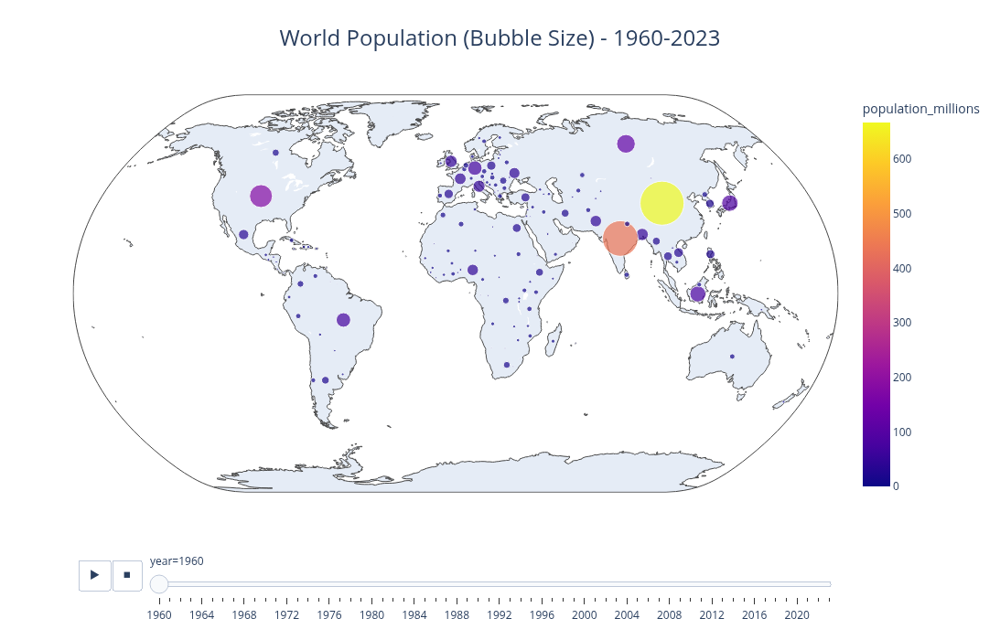

In [41]:
# Option 3: Bubble map (bubble size = population)
viz3 = MapVisualizer(df)
fig3 = viz3.create_bubble_map()
viz3.show()

In [43]:
# Save the visualization you like best as HTML
viz.save_html('world_population_animation.html')

# You can open this file in any browser!
print("🎉 Open 'world_population_animation.html' in your browser to see your animation!")


✅ Visualization saved as 'world_population_animation.html'
🎉 Open 'world_population_animation.html' in your browser to see your animation!
